Решить эллиптическое уравнение 
## \begin{equation} \label{c11eq1}
	\begin{cases}
		\displaystyle \frac{\partial^2 u}{\partial x^2} + \frac{\partial^2 u}{\partial y^2} = 0 \\
		u(x,y) = \left. \mu(x,y) \right|_{(x,y) \in \Gamma}
	\end{cases}
\end{equation}

в области $(x,y) \in [0; a] \times [0; b]$ методом счета на установления с логарифмическим набором шагов. Здесь множество $\Gamma$ - граница расчетной области. Функцию $\mu(x,y)$, размеры области и параметры сетки взять из задания к предыдущему семинару.

Необходимо построить график невязки в норме $C$ (максимум модуля) 
от номера итерации. В конце построить результирующий трехмерный профиль.

Параметры области: $a = 6\pi$, $b = 4\pi$, $T = 10$. Выбрать равномерную сетку с $h_x = h_y = \frac{\pi}{30}$ и шагом по времени $\tau = 0.1$. Коэффициент теплопроводности $k = 1$.


In [1]:
import numpy as np
from numpy import linalg as LA

import matplotlib.pyplot as plt
import matplotlib.animation as animation
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

from IPython.display import Image
import imageio

import glob

In [2]:
eps = 1e-12

k = 1

a = np.pi*6
b = np.pi*4
T = 15

h = np.pi/30

H_x = round(a/h + 1)
H_y = round(b/h + 1)

x = np.array([h*xx for xx in range(H_x)])
y = np.array([h*yy for yy in range(H_y)])

In [3]:
def mu(x,y):
    return [[-0.01*np.sin(xx) + 0.05*np.sin(yy) for xx in x] for yy in y] 

phi = lambda x,y: np.array(mu(x,y))
mu1 = lambda x,y: np.array(mu([0],y)).reshape(H_y)
mu2 = lambda x,y: np.array(mu([a],y)).reshape(H_y)
mu3 = lambda x,y: np.array(mu(x,[0])).reshape(H_x)
mu4 = lambda x,y: np.array(mu(x,[b])).reshape(H_x)

In [4]:
lambda_x_first = (np.pi/a)**2
lambda_y_first = (np.pi/b)**2
lambda_x_last = 4/h**2
lambda_y_last = 4/h**2

lambda_min = min(lambda_x_first, lambda_y_first)
lambda_max = max(lambda_x_last, lambda_y_last)

S = 1/4 * np.log(1/eps) * np.log(lambda_max/lambda_min)
S = int(round(S/2))

tau = [2/lambda_max * (lambda_max/lambda_min)**((s)/(S-1)) for s in range(S)]
Tau = len(tau)

In [5]:
def L(H):
    
    data =  np.diag([-2]*H) + \
            np.diag([1]*(H-1), k=1) + \
            np.diag([1]*(H-1), k=-1)
            
    data[0,0:2] = data[-1, H-2:H] = [0, 0]     

    return k/h**2 * data


def create_v(u, Lx, Ly):
    
    v1 = np.zeros((H_y,H_x))
    v2 = np.zeros((H_y,H_x))
        
    v1[1:-1,:] = u[1:-1,:].dot(Lx)
    v2[:,1:-1] = Ly.dot(u[:,1:-1])
    
    return v1 + v2

In [6]:
def factored_scheme(phi, mu1, mu2, mu3, mu4, tau, L):
    
    a = 1/2
    
    U = np.zeros(( Tau, H_y, H_x))
    
    U[0,:,:]     = phi
    U[0,:,0]     = mu1
    U[0,:,H_x-1] = mu2
    U[0,0,:]     = mu3
    U[0,H_y-1,:] = mu4
    
    Lx = L(H_x).T
    Ly = L(H_y)
    
    discr = []
    
    for i in range(Tau - 1):
        
        Px = np.eye(H_x) - a * tau[i] * Lx
        Py = np.eye(H_y) - a * tau[i] * Ly
    
        u = U[i,:,:]
       
        v = create_v(u, Lx, Ly)
        
        discr.append(np.max(np.abs(v)))
        
        # The operators / and \ are related to each other by the equation B/A = (A'\B')'.
        v = LA.solve(Px.T, v.T).T
        
        du = LA.solve(Py, v)
        
        U[i+1, :, :] = u + tau[i] * du
        
    return U, discr

In [7]:
%%time
U, discr = factored_scheme(phi(x,y), mu1(x,y), mu2(x,y), mu3(x,y), mu4(x,y), tau, L)

Wall time: 1.7 s


In [16]:
e = lambda x: np.exp(-(x-5)**4)
e(0.01)

5.381650429395834e-270

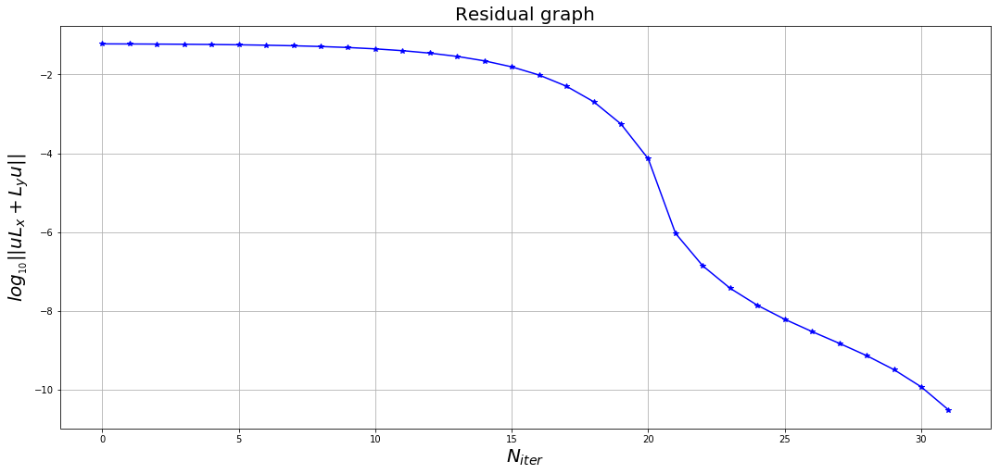

In [21]:
plt.figure(figsize = (18, 8))

plt.plot(range(len(discr)), np.log10(discr), 'b')
plt.plot(range(len(discr)), np.log10(discr), '*b')

plt.xlabel(r'$N_{iter}$',fontsize = 20)
plt.ylabel(r'$log_{_{10}}||uL_x+L_yu||$',fontsize = 20)
plt.title('Residual graph', fontsize = 20)
plt.grid()

plt.show()

In [3]:
%matplotlib inline

imags_path = 'lab_11_im/'
gif_filename = 'anim_lab_11'

gif_filepath = imags_path  + gif_filename
colormap = cm.inferno

m = 1

def create_images(m, gif_filepath):
        
    xgrid,ygrid = np.meshgrid(x,y)
    

    frames = int(Tau/m)

    print('frames:', frames)

    for n in range(0, frames):

        if n%5 == 0:
            print('  ',n)

        fig = plt.figure('Граничные условия Дирихле',figsize=(18,10))
        ax = Axes3D(fig)

        ax.plot_surface(ygrid, xgrid, U[n*m], rstride=1, cstride=1, cmap = colormap)
        ax.view_init(elev=50. - n*m/10, azim=30 + n*m/3)

        ax.set_xlim(0, np.pi*4)
        ax.set_ylim(0, np.pi*6)
        ax.set_zlim(-0.11,0.11)
    
        fig.suptitle(u't = {:02.4f}'.format(tau[n*m]), fontsize=20, x=0.5, y=1)

        plt.savefig(gif_filepath  + str(n).zfill(3) + '.png', bbox_inches='tight')
    
def create_gif(imags_path, gif_filepath):
    
    images = []
    for filename in glob.glob(imags_path + '*.png'):
        images.append(imageio.imread(filename))
    imageio.mimsave(gif_filepath + '.gif', images)

In [11]:
#create_images(m, gif_filepath)
#create_gif(imags_path, gif_filepath)

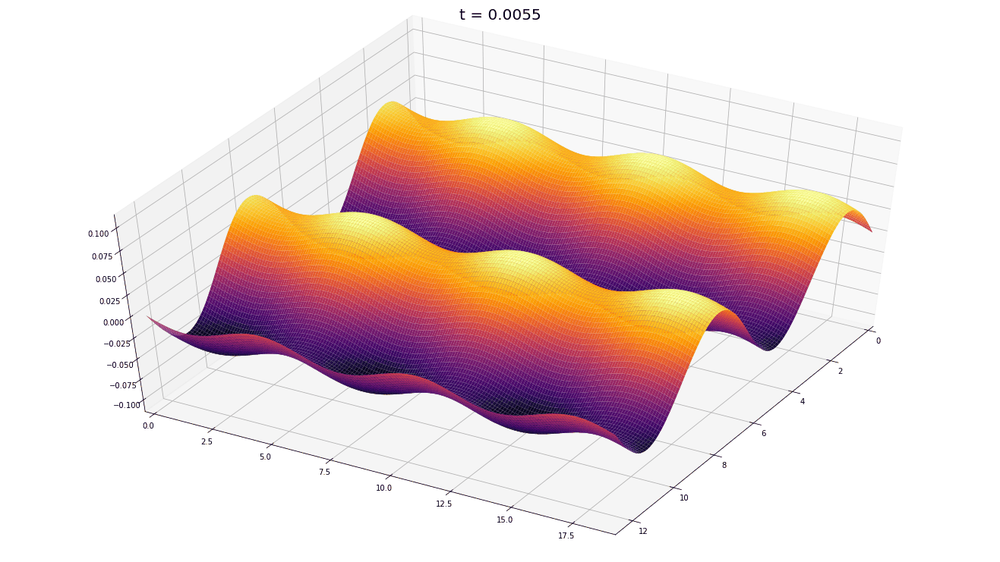

In [7]:
Image(filename = gif_filepath + '.gif')